# Data Analytics Project

#### *lendingclub_loan_data.csv* dataset

In [1545]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split

In [1546]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

In [1547]:
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

### Dataset is based on data provided by LendingClub 

https://www.lendingclub.com
    
### The dataset was provided by Kaggle and contains information on loan borrowers 
collected by LendingClub from the year 2007 to 2010. 



Listing of attributes:
    
* credit.policy: a set of guidelines and criteria that decides on credit limits, credit terms, and how to go about delinquent accounts. The borrower either meets the criteria (represented by the integer 1 in our data) or does not (represented by 0 in our data).
* purpose: purpose of the loan contracted (a.i: installment, debt consolidation)
* int.rate: interest rate on the loan.
* installment: monthly payment owed by the borrower.
* log.annual.inc: natural logarithm of self-reported income.
* dti: Debt-to-Income ratio
* fico: FICO score of loan borrowers
* days.with.cr.line: number of days with line of credit.
* revol.bal: revolving balance or the portion of credit that remains unpaid after billing cycle.
* revol.util: revolving utilization or debt-to-limit ratio, debt divided by credit limit.
* inq.last.6mths: inquiries during last 6 months. Inquiries happen when a financial institution checks your credit to make a lending decision, this usually happens when you apply for credit. There are two types of inquiries: hard inquiries or ‘hard pulls’ when you apply for mortgage, credit card… and soft inquiries or ‘soft pulls’ for credit card offers or employment. For the purpose of this project, we will consider the data to represent ‘hard pulls’.
* delinq.2yrs: number of loan delinquencies (30 days or more past due on a payment) reported during the past 2 years.
* pub.rec: number of derogatory public records of loan borrowers.
* not.fully.paid: this column shows whether a loan was not fully paid (1) or fully paid (0)

### Your task in the final project is build the best predictive model to predict what type of borrower will be more likely to default (i.e not fully paid back their loan)

* Use any one of the models (Logistic, SVM, Naive Bayes, Decision Tree and Random Forecast) that we have covered in class.
* Do not use any models that we have not covered in class.
*
* The best performance model will have an extra 5 points, but the whole project will still be capped 100



### Make sure your work include the following steps

* EDA (chekcing missing values, removing outliers)
* performed basic exploration of relationship, with plots and graphs
* separated data set into training and testing
* setup dummy variables to take care categorical variables
* normalize numerical features if needed
* tried at least two models and checked their model performance
* performed cross-validations


In [1548]:
df = pd.read_csv("lendingclub_loan_data.csv")
df.head(50)

,credit.policy,purpose,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
0,1,debt_consolidation,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,0
1,1,credit_card,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,0
2,1,debt_consolidation,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.6,1,0,0,0
3,1,debt_consolidation,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.2,1,0,0,0
4,1,credit_card,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.5,0,1,0,0
5,1,credit_card,0.0788,125.13,11.904968,16.98,727,6120.041667,50807,51.0,0,0,0,0
6,1,debt_consolidation,0.1496,194.02,10.714418,4.00,667,3180.041667,3839,76.8,0,0,1,1
7,1,all_other,0.1114,131.22,11.002100,11.08,722,5116.000000,24220,68.6,0,0,0,1
8,1,home_improvement,0.1134,87.19,11.407565,17.25,682,3989.000000,69909,51.1,1,0,0,0
9,1,debt_consolidation,0.1221,84.12,10.203592,10.00,707,2730.041667,5630,23.0,1,0,0,0


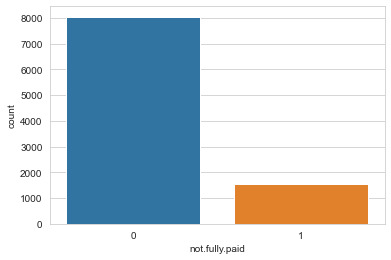

In [1549]:
sns.countplot(df['not.fully.paid'])

### Good Luck !!!

Show all your work below

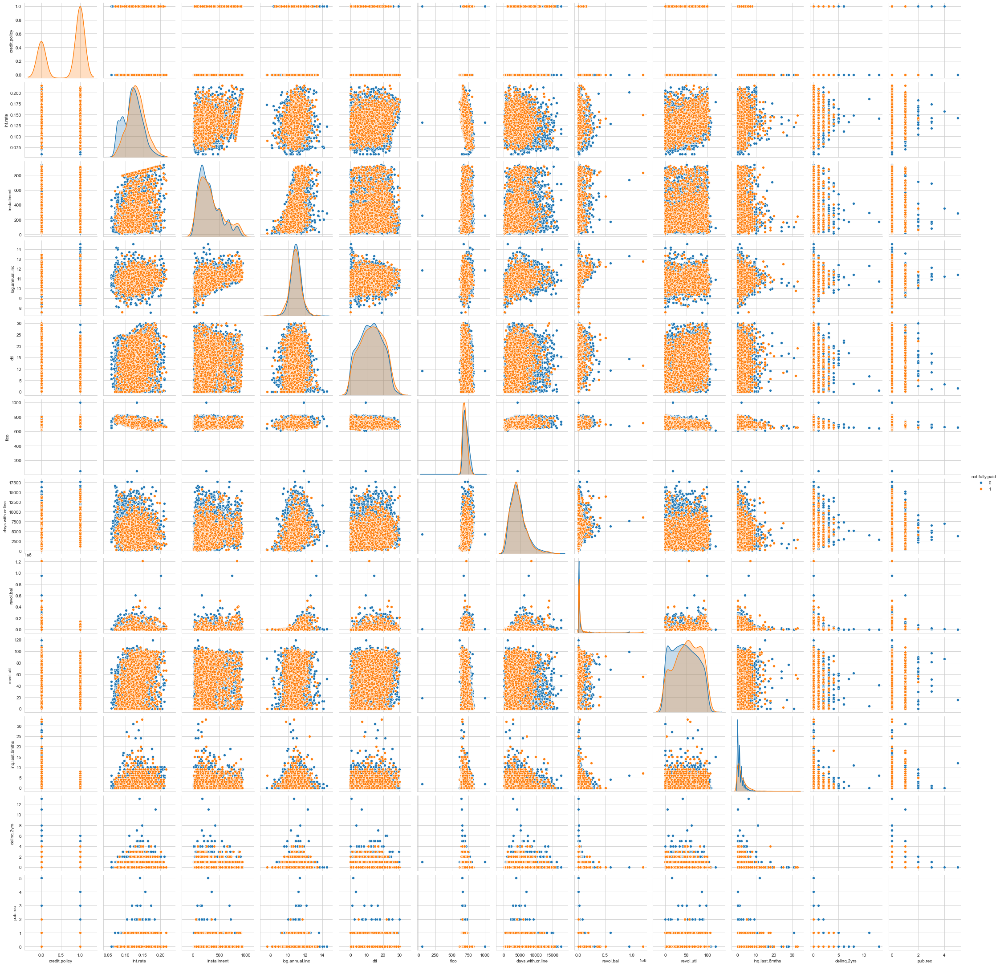

In [1550]:
sns.pairplot(df, hue='not.fully.paid')

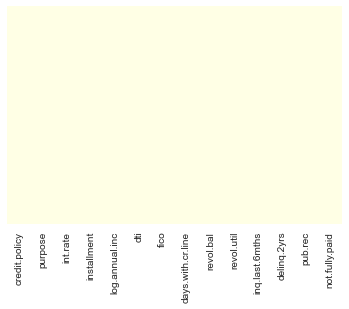

In [1551]:
sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='YlOrBr')

## Find and Remove Missing Values

In [1552]:
df.isnull().sum()

credit.policy        0
purpose              0
int.rate             0
installment          1
log.annual.inc       1
dti                  0
fico                 0
days.with.cr.line    0
revol.bal            0
revol.util           0
inq.last.6mths       0
delinq.2yrs          0
pub.rec              0
not.fully.paid       0
dtype: int64

In [1553]:
df = df.dropna()

In [1554]:
df.isnull().sum()

credit.policy        0
purpose              0
int.rate             0
installment          0
log.annual.inc       0
dti                  0
fico                 0
days.with.cr.line    0
revol.bal            0
revol.util           0
inq.last.6mths       0
delinq.2yrs          0
pub.rec              0
not.fully.paid       0
dtype: int64

## Find and Remove Outliers

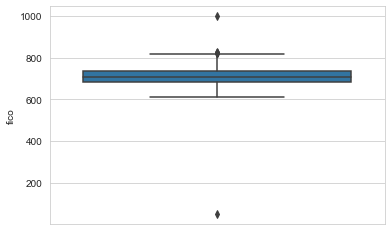

In [1555]:
sns.boxplot(y=df['fico'])

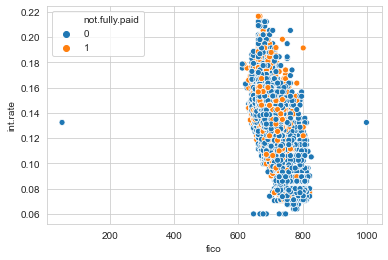

In [1556]:
sns.scatterplot(x = 'fico', y = 'int.rate', data=df, hue='not.fully.paid')

In [1557]:
print("Before removal: ", df.shape)

df = df[df.fico > 200] 
df = df[df.fico < 900]

print("After removal: ", df.shape)

Before removal:  (9580, 14)
After removal:  (9578, 14)


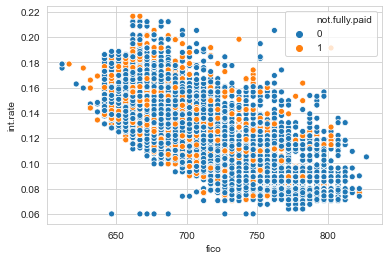

In [1558]:
sns.scatterplot(x = 'fico', y = 'int.rate', data=df, hue='not.fully.paid')

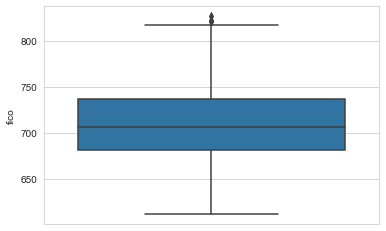

In [1559]:
sns.boxplot(y=df['fico'])

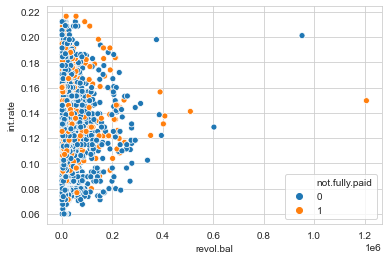

In [1560]:
sns.scatterplot(x = 'revol.bal', y = 'int.rate', data=df, hue='not.fully.paid')

In [1561]:
print("Before removal: ", df.shape)

df = df[df['revol.bal'] < 800000] 

print("After removal: ", df.shape)

Before removal:  (9578, 14)
After removal:  (9576, 14)


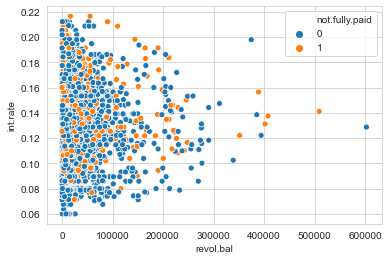

In [1562]:
sns.scatterplot(x = 'revol.bal', y = 'int.rate', data=df, hue='not.fully.paid')

In [1563]:
features = ['credit.policy', 'purpose', 'int.rate', 'installment', 'log.annual.inc', 'dti', 'fico', 'days.with.cr.line', 'revol.bal', 'revol.util', 'inq.last.6mths', 'delinq.2yrs', 'pub.rec', 'not.fully.paid']

## Basic Exploration of Relationships - Plots and Graphs

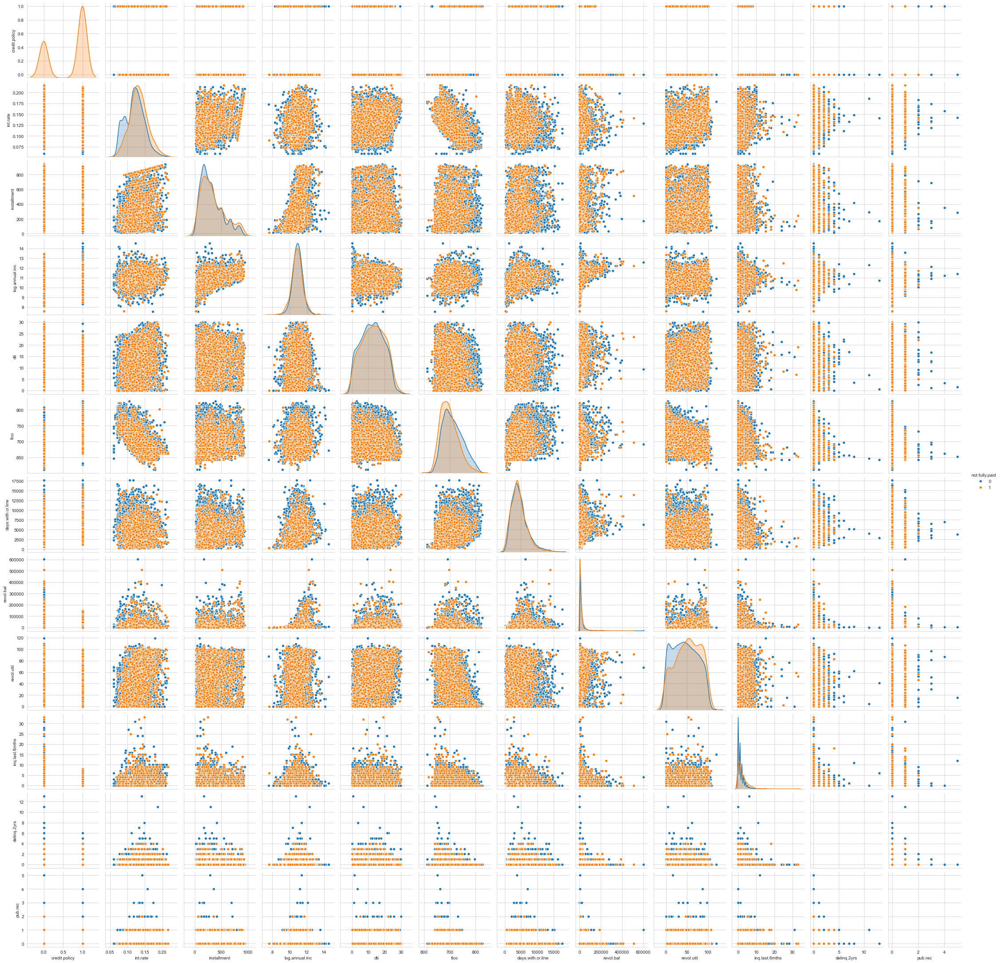

In [1564]:
sns.pairplot(df, hue='not.fully.paid')

In [1565]:
df.corr()

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
credit.policy,1.000000,-0.293529,0.059778,0.036418,-0.090923,0.348306,0.099686,-0.196033,-0.103709,-0.535075,-0.076479,-0.054367,-0.157839
int.rate,-0.293529,1.000000,0.275551,0.054988,0.220056,-0.714922,-0.124651,0.090474,0.464568,0.202116,0.156281,0.098309,0.159569
installment,0.059778,0.275551,1.000000,0.447315,0.050220,0.086263,0.182766,0.246191,0.080954,-0.011489,-0.004230,-0.032666,0.049495
log.annual.inc,0.036418,0.054988,0.447315,1.000000,-0.054181,0.115087,0.336397,0.394268,0.054134,0.027643,0.029454,0.016697,-0.034029
dti,-0.090923,0.220056,0.050220,-0.054181,1.000000,-0.241175,0.060110,0.212258,0.337127,0.029196,-0.021790,0.006211,0.037427
fico,0.348306,-0.714922,0.086263,0.115087,-0.241175,1.000000,0.264054,-0.014840,-0.541227,-0.185228,-0.216381,-0.147622,-0.149803
days.with.cr.line,0.099686,-0.124651,0.182766,0.336397,0.060110,0.264054,1.000000,0.247531,-0.024531,-0.042433,0.081480,0.071911,-0.029575
revol.bal,-0.196033,0.090474,0.246191,0.394268,0.212258,-0.014840,0.247531,1.000000,0.222142,0.008445,-0.035185,-0.033136,0.052361
revol.util,-0.103709,0.464568,0.080954,0.054134,0.337127,-0.541227,-0.024531,0.222142,1.000000,-0.014349,-0.042682,0.066781,0.082132
inq.last.6mths,-0.535075,0.202116,-0.011489,0.027643,0.029196,-0.185228,-0.042433,0.008445,-0.014349,1.000000,0.021397,0.072823,0.149075


In [1566]:
df.head()

,credit.policy,purpose,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
0,1,debt_consolidation,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,0
1,1,credit_card,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,0
2,1,debt_consolidation,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.6,1,0,0,0
3,1,debt_consolidation,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.2,1,0,0,0
4,1,credit_card,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.5,0,1,0,0


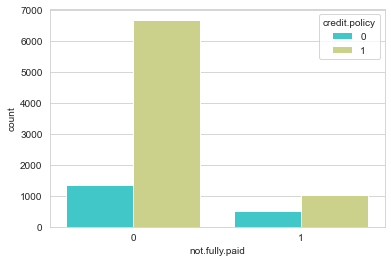

In [1567]:
sns.set_style('whitegrid')
sns.countplot(x='not.fully.paid',hue='credit.policy',data=df,palette='rainbow')

In [1568]:
df.groupby('not.fully.paid').mean()

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec
not.fully.paid,,,,,,,,,,,,
0,0.832422,0.120760,314.521850,10.940797,12.494177,713.332049,4592.256273,16006.378046,45.752990,1.433366,0.161611,0.056564
1,0.661880,0.132441,342.466097,10.883795,13.197023,697.815927,4390.847721,20291.951044,52.252631,2.327676,0.174935,0.091384


## Normalization of Data Set

In [1569]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

numerical_features = df[["int.rate", "installment", "log.annual.inc", "dti", "fico", "days.with.cr.line", "revol.bal", "revol.util"]]
numerical_features.head()

scaler = StandardScaler()
normalized_df = scaler.fit_transform(numerical_features)
normalized_df = pd.DataFrame(normalized_df, index = df.index, columns = ["int.rate", "installment", "log.annual.inc", "dti", "fico", "days.with.cr.line", "revol.bal", "revol.util"] )
normalized_df.head()

,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util
0,-0.138962,2.464618,0.681879,0.998415,0.688702,0.432569,0.405345,0.182937
1,-0.578687,-0.438573,0.245024,0.244525,-0.101388,-0.721012,0.564289,1.030895
2,0.487086,0.231275,-0.908979,-0.141862,-0.759795,0.060069,-0.439306,-0.730513
3,-0.813455,-0.756877,0.681879,-0.654624,0.030294,-0.745062,0.565756,0.910251
4,0.744213,-1.043968,0.599358,0.343300,-1.154840,-0.197888,-0.398345,-0.251382


In [1570]:
minMaxScaler = MinMaxScaler()
minMax_df = minMaxScaler.fit_transform(numerical_features)
minMax_df = pd.DataFrame(minMax_df, columns = ["int.rate", "installment", "log.annual.inc", "dti", "fico", "days.with.cr.line", "revol.bal", "revol.util"] )
minMax_df.head()

,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util
0,0.376598,0.879888,0.544762,0.650200,0.581395,0.312754,0.047889,0.437815
1,0.301151,0.229916,0.506334,0.476969,0.441860,0.147818,0.055804,0.644538
2,0.484015,0.379883,0.404820,0.388184,0.325581,0.259495,0.005827,0.215126
3,0.260870,0.158653,0.544762,0.270360,0.465116,0.144379,0.055877,0.615126
4,0.528133,0.094378,0.537503,0.499666,0.255814,0.222613,0.007867,0.331933


In [1571]:
df_new = pd.concat([df['credit.policy'], normalized_df], axis=1)

In [1572]:
df_new.head()

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util
0,1,-0.138962,2.464618,0.681879,0.998415,0.688702,0.432569,0.405345,0.182937
1,1,-0.578687,-0.438573,0.245024,0.244525,-0.101388,-0.721012,0.564289,1.030895
2,1,0.487086,0.231275,-0.908979,-0.141862,-0.759795,0.060069,-0.439306,-0.730513
3,1,-0.813455,-0.756877,0.681879,-0.654624,0.030294,-0.745062,0.565756,0.910251
4,1,0.744213,-1.043968,0.599358,0.343300,-1.154840,-0.197888,-0.398345,-0.251382


In [1573]:
df_new = pd.concat([df_new, df['purpose']], axis=1)

In [1574]:
df_new = pd.concat([df_new, df['inq.last.6mths']], axis=1)

In [1575]:
df_new = pd.concat([df_new, df['delinq.2yrs']], axis=1)

In [1576]:
df_new = pd.concat([df_new, df['pub.rec']], axis=1)

In [1577]:
df_new = pd.concat([df_new, df['not.fully.paid']], axis=1)

In [1578]:
df_new.head()

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,purpose,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
0,1,-0.138962,2.464618,0.681879,0.998415,0.688702,0.432569,0.405345,0.182937,debt_consolidation,0,0,0,0
1,1,-0.578687,-0.438573,0.245024,0.244525,-0.101388,-0.721012,0.564289,1.030895,credit_card,0,0,0,0
2,1,0.487086,0.231275,-0.908979,-0.141862,-0.759795,0.060069,-0.439306,-0.730513,debt_consolidation,1,0,0,0
3,1,-0.813455,-0.756877,0.681879,-0.654624,0.030294,-0.745062,0.565756,0.910251,debt_consolidation,1,0,0,0
4,1,0.744213,-1.043968,0.599358,0.343300,-1.154840,-0.197888,-0.398345,-0.251382,credit_card,0,1,0,0


In [1579]:
df = df_new

# Logistic Regression

In [1580]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score
from sklearn import metrics
import random

In [1583]:
#Create Dummy Variables For Categorical Feature - Purpose
purp = pd.get_dummies(df['purpose'],drop_first=True)

In [1584]:
features3 = ['credit.policy', 'int.rate', 'installment', 'log.annual.inc', 'dti', 'fico', 'days.with.cr.line', 'revol.bal', 'revol.util', 'inq.last.6mths', 'delinq.2yrs', 'pub.rec', 'not.fully.paid']

In [1585]:
print("Logistic Regression without categorical variable 'Purpose'")

Logistic Regression without categorical variable 'Purpose'


In [1586]:
df1 = pd.concat([df[features3]], axis=1)
df1.head()

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
0,1,-0.138962,2.464618,0.681879,0.998415,0.688702,0.432569,0.405345,0.182937,0,0,0,0
1,1,-0.578687,-0.438573,0.245024,0.244525,-0.101388,-0.721012,0.564289,1.030895,0,0,0,0
2,1,0.487086,0.231275,-0.908979,-0.141862,-0.759795,0.060069,-0.439306,-0.730513,1,0,0,0
3,1,-0.813455,-0.756877,0.681879,-0.654624,0.030294,-0.745062,0.565756,0.910251,1,0,0,0
4,1,0.744213,-1.043968,0.599358,0.343300,-1.154840,-0.197888,-0.398345,-0.251382,0,1,0,0


In [1587]:
train = df1

In [1588]:
df1

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
0,1,-0.138962,2.464618,0.681879,0.998415,0.688702,0.432569,0.405345,0.182937,0,0,0,0
1,1,-0.578687,-0.438573,0.245024,0.244525,-0.101388,-0.721012,0.564289,1.030895,0,0,0,0
2,1,0.487086,0.231275,-0.908979,-0.141862,-0.759795,0.060069,-0.439306,-0.730513,1,0,0,0
3,1,-0.813455,-0.756877,0.681879,-0.654624,0.030294,-0.745062,0.565756,0.910251,1,0,0,0
4,1,0.744213,-1.043968,0.599358,0.343300,-1.154840,-0.197888,-0.398345,-0.251382,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9576,0,0.874639,0.124498,2.034060,-0.321982,-1.023158,2.368868,6.621759,1.217032,2,0,0,1
9577,0,0.099532,-0.296139,0.342274,-1.800711,0.293657,-0.072114,-0.550191,-1.575024,5,0,0,1
9578,0,-0.578687,-1.068658,-0.545601,0.070215,-0.628114,-0.444613,-0.221836,1.244608,8,0,0,1
9579,0,1.392620,0.157449,-0.182223,0.954837,-0.496432,-1.105545,-0.556324,-1.502637,5,0,0,1


In [1589]:
X_train, X_test, y_train, y_test = train_test_split(train.drop('not.fully.paid',axis=1), 
                                                    train['not.fully.paid'], test_size=0.20, 
                                                    random_state=101)

In [1590]:
model1 = LogisticRegression()
model1.fit(X_train,y_train)

LogisticRegression()

In [1591]:
predictions1 = model1.predict(X_test)

In [1592]:
print(classification_report(y_test,predictions1))
print(accuracy_score(y_test, predictions1))

              precision    recall  f1-score   support

           0       0.85      1.00      0.92      1622
           1       0.40      0.01      0.03       294

    accuracy                           0.85      1916
   macro avg       0.62      0.50      0.47      1916
weighted avg       0.78      0.85      0.78      1916

0.8455114822546973


In [1593]:
print("Logistic Regression With Categorical Variable 'Purpose': ")

Logistic Regression With Categorical Variable 'Purpose': 


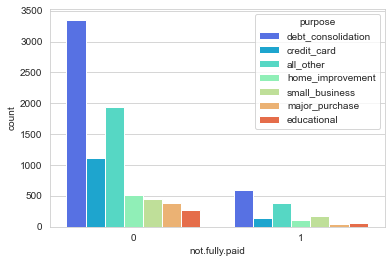

In [1594]:
sns.set_style('whitegrid')
sns.countplot(x='not.fully.paid',hue='purpose',data=df,palette='rainbow')

In [1595]:
df2 = pd.concat([df[features3], purp], axis=1)
df2.head()

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid,credit_card,debt_consolidation,educational,home_improvement,major_purchase,small_business
0,1,-0.138962,2.464618,0.681879,0.998415,0.688702,0.432569,0.405345,0.182937,0,0,0,0,0,1,0,0,0,0
1,1,-0.578687,-0.438573,0.245024,0.244525,-0.101388,-0.721012,0.564289,1.030895,0,0,0,0,1,0,0,0,0,0
2,1,0.487086,0.231275,-0.908979,-0.141862,-0.759795,0.060069,-0.439306,-0.730513,1,0,0,0,0,1,0,0,0,0
3,1,-0.813455,-0.756877,0.681879,-0.654624,0.030294,-0.745062,0.565756,0.910251,1,0,0,0,0,1,0,0,0,0
4,1,0.744213,-1.043968,0.599358,0.343300,-1.154840,-0.197888,-0.398345,-0.251382,0,1,0,0,1,0,0,0,0,0


In [1596]:
train = df2

In [1597]:
X_train, X_test, y_train, y_test = train_test_split(train.drop('not.fully.paid',axis=1), 
                                                    train['not.fully.paid'], test_size=0.20, 
                                                    random_state=101)

In [1598]:
model2 = LogisticRegression()
model2.fit(X_train,y_train)

LogisticRegression()

In [1599]:
predictions2 = model2.predict(X_test)

In [1600]:
print(classification_report(y_test,predictions2))
print(accuracy_score(y_test, predictions2))

              precision    recall  f1-score   support

           0       0.85      1.00      0.92      1622
           1       0.69      0.03      0.06       294

    accuracy                           0.85      1916
   macro avg       0.77      0.51      0.49      1916
weighted avg       0.83      0.85      0.79      1916

0.8491649269311065


In [1601]:
print("Compared with the first model, the inclusion of purpose increased the F1 score from 0.03 to 0.06")
print("Compared with the first model, the inclusion of purpose increased precision from 0.40 to 0.69")
print("Compared with the first model, the inclusion of purpose only marginally improved the accuracy from 0.8455 to 0.8491")

Compared with the first model, the inclusion of purpose increased the F1 score from 0.03 to 0.06
Compared with the first model, the inclusion of purpose increased precision from 0.40 to 0.69
Compared with the first model, the inclusion of purpose only marginally improved the accuracy from 0.8455 to 0.8491


In [1602]:
print("10-fold Cross Validation: ")

10-fold Cross Validation: 


In [1603]:
accuracy = []
f1 = []
precision = []
for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(train.drop('not.fully.paid',axis=1), 
                                                    train['not.fully.paid'], test_size=0.20, 
                                                    random_state = random.randint(1,1000))
    model3 = LogisticRegression()
    model3.fit(X_train, y_train)
    Y_pred = model3.predict(X_test)
    accuracy.append(metrics.accuracy_score(y_test, Y_pred))
    f1.append(metrics.f1_score(y_test, Y_pred))
    precision.append(metrics.precision_score(y_test, Y_pred))
    
df_ten = pd.DataFrame( {'trial': range(10), 'Accuracy': accuracy, 'F1 Score' : f1, 'Precision': precision})
df_ten

,trial,Accuracy,F1 Score,Precision
0,0,0.845511,0.045161,0.411765
1,1,0.828288,0.051873,0.473684
2,2,0.841336,0.044025,0.318182
3,3,0.830376,0.052478,0.333333
4,4,0.838727,0.055046,0.428571
5,5,0.842902,0.038339,0.352941
6,6,0.835073,0.070588,0.545455
7,7,0.851253,0.053156,0.727273
8,8,0.850209,0.027119,0.266667
9,9,0.845511,0.045161,0.437500


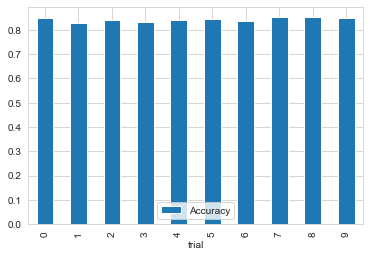

In [1604]:
df_ten.plot.bar(x='trial', y='Accuracy')

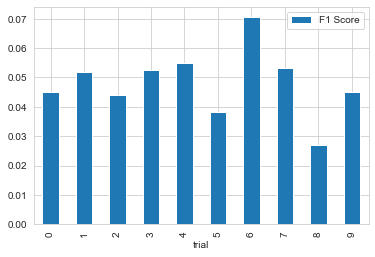

In [1605]:
df_ten.plot.bar(x='trial', y='F1 Score')

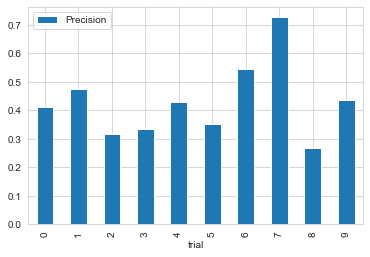

In [1606]:
df_ten.plot.bar(x='trial', y='Precision')

In [1611]:
print("Accuracy 10-Fold Cross Validation Mean: ", df_ten['Accuracy'].mean(), "\n", )
print("Accuracy Model 2: ", metrics.accuracy_score(y_test, Y_pred), "\n\n")

print("F1 Score 10-Fold Cross Validation Mean: ", df_ten['F1 Score'].mean(), "\n", )
print("F1 Score Model 2: ", metrics.f1_score(y_test, Y_pred), "\n\n")

print("Precision 10-Fold Cross Validation Mean: ", df_ten['Precision'].mean(), "\n", )
print("Precision Model 2: ", metrics.precision_score(y_test, Y_pred), "\n\n")

print("Model Passes Cross Validation")

Accuracy 10-Fold Cross Validation Mean:  0.8409185803757827 

Accuracy Model 2:  0.8455114822546973 


F1 Score 10-Fold Cross Validation Mean:  0.04829466260838293 

F1 Score Model 2:  0.04516129032258064 


Precision 10-Fold Cross Validation Mean:  0.4295370612359776 

Precision Model 2:  0.4375 


Model Passes Cross Validation


## Decision Tree

In [1612]:
from sklearn.tree import DecisionTreeClassifier
model4 = DecisionTreeClassifier()

In [1613]:
model4.fit(X_train,y_train)

DecisionTreeClassifier()

In [1614]:
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

In [1615]:
predictions4 = model4.predict(X_test)
print(confusion_matrix(y_test,predictions4))
print(classification_report(y_test,predictions4))
print(accuracy_score(y_test, predictions4))

[[1368  254]
 [ 226   68]]
              precision    recall  f1-score   support

           0       0.86      0.84      0.85      1622
           1       0.21      0.23      0.22       294

    accuracy                           0.75      1916
   macro avg       0.53      0.54      0.54      1916
weighted avg       0.76      0.75      0.75      1916

0.7494780793319415


In [1616]:
model5 = DecisionTreeClassifier(max_depth=50, criterion='entropy')
model5.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=50)

In [1617]:
predictions5 = model5.predict(X_test)
print(confusion_matrix(y_test,predictions5))
print(classification_report(y_test,predictions5))
print(accuracy_score(y_test, predictions5))

[[1372  250]
 [ 222   72]]
              precision    recall  f1-score   support

           0       0.86      0.85      0.85      1622
           1       0.22      0.24      0.23       294

    accuracy                           0.75      1916
   macro avg       0.54      0.55      0.54      1916
weighted avg       0.76      0.75      0.76      1916

0.7536534446764092


In [1618]:
model6 = DecisionTreeClassifier(max_depth=10, criterion='entropy')
model6.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=10)

In [1619]:
predictions6 = model6.predict(X_test)
print(confusion_matrix(y_test,predictions6))
print(classification_report(y_test,predictions6))
print(accuracy_score(y_test, predictions6))

[[1538   84]
 [ 267   27]]
              precision    recall  f1-score   support

           0       0.85      0.95      0.90      1622
           1       0.24      0.09      0.13       294

    accuracy                           0.82      1916
   macro avg       0.55      0.52      0.52      1916
weighted avg       0.76      0.82      0.78      1916

0.8168058455114823


In [1620]:
print("max_depth=10 (model6) yields best accuracy results (0.8168058455114823) and best precision (0.24)")
print("max_depth=50 (model5) yields best F1 score results (0.23)")

max_depth=10 (model6) yields best accuracy results (0.8168058455114823) and best precision (0.24)
max_depth=50 (model5) yields best F1 score results (0.23)


In [1622]:
print("Visualize Decision Tree Models: ")

Visualize Decision Tree Models: 


In [1623]:
from IPython.display import Image  
# from sklearn.externals.six import StringIO
# Error, used fix posted on discussion in Blackboard
from sklearn.tree import export_graphviz
from six import StringIO
import io
import pydot 

# Pick up all featurs columns from your data frame
features = list(df2.drop(['not.fully.paid'],axis=1).columns)
features

['credit.policy',
 'int.rate',
 'installment',
 'log.annual.inc',
 'dti',
 'fico',
 'days.with.cr.line',
 'revol.bal',
 'revol.util',
 'inq.last.6mths',
 'delinq.2yrs',
 'pub.rec',
 'credit_card',
 'debt_consolidation',
 'educational',
 'home_improvement',
 'major_purchase',
 'small_business']

In [1624]:
print("model4: max_depth=none, criterion='gini'")

dot_data = StringIO()  

export_graphviz(model4, out_file=dot_data, feature_names=features)
(graph, ) = pydot.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

model4: max_depth=none, criterion='gini'


In [1625]:
print("model5: max_depth=50, criterion='entropy'")

dot_data = StringIO()  

export_graphviz(model5, out_file=dot_data, feature_names=features)
(graph, ) = pydot.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

model5: max_depth=50, criterion='entropy'


model6: max_depth=10, criterion='entropy'


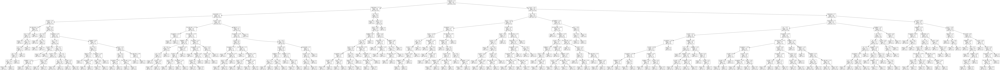

In [1626]:
print("model6: max_depth=10, criterion='entropy'")

dot_data = StringIO()  

export_graphviz(model6, out_file=dot_data, feature_names=features)
(graph, ) = pydot.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [1627]:
print("10-fold Cross Validation: ")

10-fold Cross Validation: 


In [1630]:
accuracy = []
f1 = []
precision = []
for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(train.drop('not.fully.paid',axis=1), 
                                                    train['not.fully.paid'], test_size=0.20, 
                                                    random_state = random.randint(1,1000))
    model7 = DecisionTreeClassifier()
    model7.fit(X_train, y_train)
    Y_pred = model7.predict(X_test)
    accuracy.append(metrics.accuracy_score(y_test, Y_pred))
    f1.append(metrics.f1_score(y_test, Y_pred))
    precision.append(metrics.precision_score(y_test, Y_pred))
    
df_ten2 = pd.DataFrame( {'trial': range(10), 'Accuracy': accuracy, 'F1 Score' : f1, 'Precision': precision})
df_ten2

,trial,Accuracy,F1 Score,Precision
0,0,0.721816,0.178737,0.155496
1,1,0.727035,0.220566,0.202740
2,2,0.750522,0.197987,0.187898
3,3,0.743215,0.259036,0.246418
4,4,0.737474,0.232061,0.223529
5,5,0.730167,0.229508,0.225806
6,6,0.758351,0.244698,0.237342
7,7,0.722860,0.242511,0.219638
8,8,0.760960,0.236667,0.220497
9,9,0.736952,0.222222,0.225705


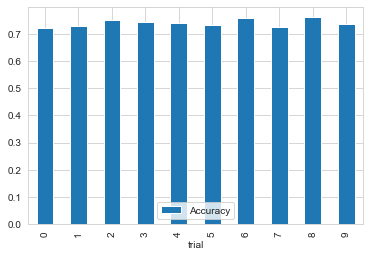

In [1631]:
df_ten2.plot.bar(x='trial', y='Accuracy')

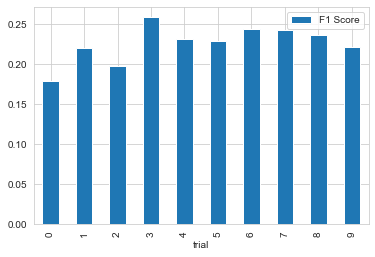

In [1632]:
df_ten2.plot.bar(x='trial', y='F1 Score')

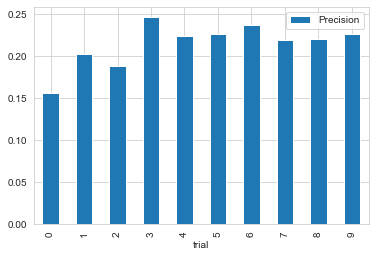

In [1633]:
df_ten2.plot.bar(x='trial', y='Precision')

In [1634]:
print("Accuracy 10-Fold Cross Validation Mean: ", df_ten2['Accuracy'].mean(), "\n", )
print("Accuracy Model 2: ", metrics.accuracy_score(y_test, Y_pred), "\n\n")

print("F1 Score 10-Fold Cross Validation Mean: ", df_ten2['F1 Score'].mean(), "\n", )
print("F1 Score Model 2: ", metrics.f1_score(y_test, Y_pred), "\n\n")


print("Precision 10-Fold Cross Validation Mean: ", df_ten2['Precision'].mean(), "\n", )
print("Precision Model 2: ", metrics.precision_score(y_test, Y_pred), "\n\n")


print("Model Passes Cross Validation")

Accuracy 10-Fold Cross Validation Mean:  0.7389352818371607 

Accuracy Model 2:  0.7369519832985386 


F1 Score 10-Fold Cross Validation Mean:  0.22639926172664743 

F1 Score Model 2:  0.22222222222222224 


Precision 10-Fold Cross Validation Mean:  0.21450702338476407 

Precision Model 2:  0.22570532915360503 


Model Passes Cross Validation


In [1638]:
print("Logistic Regression: ")
print("F1 Score 10-Fold Cross Validation Mean:  0.04829466260838293" , "\n\n")

print("Decision Tree: ")
print("F1 Score 10-Fold Cross Validation Mean:  0.22639926172664743", "\n\n")

print("Results: ")
print("Decision Tree Model yields best F1 score, is best predictive model to predict what type of borrower will be more likely to default")

Logistic Regression: 
F1 Score 10-Fold Cross Validation Mean:  0.04829466260838293 


Decision Tree: 
F1 Score 10-Fold Cross Validation Mean:  0.22639926172664743 


Results: 
Decision Tree Model yields best F1 score, is best predictive model to predict what type of borrower will be more likely to default
